In [12]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import sys
from wave_approx import *
import pickle
import matplotlib.gridspec as gs

%load_ext autoreload
%autoreload 2
mpl.rcParams.update({'font.family': 'CMU Sans Serif', 'axes.unicode_minus' : False})
def get_colors(n, sat0 = 0.3, val0 = 0.1, val1 = 1.0):
    sat_green = np.zeros((n,3))
    sat_red = np.zeros((n,3))
    sat_blue = np.zeros((n,3))
    sat_green[:,0] = 1/3
    sat_red[:,0] = 0
    sat_blue[:,0] = 2/3 

    #sat_green[:,1] = np.linspace(sat0, 1, n)
    sat_green[:,1] = sat0
    sat_green[:,2] = np.power(np.linspace(val0, val1, n), 0.5)
    #sat_green[:,2] = 0.5

    sat_red[:,1] = np.linspace(sat0, 1, n)
    #sat_red[:,1] = sat0
    #sat_red[:,2] = np.linspace(val0, val1, n)
    sat_red[:,2] = val1

    sat_blue[:,1] = np.linspace(sat0, 1, n)
    #sat_blue[:,1] = sat0
    #sat_blue[:,2] = np.linspace(val0, val1, n)
    sat_blue[:,2] = val1
    greens = mpl.colors.hsv_to_rgb(sat_green)
    reds = mpl.colors.hsv_to_rgb(sat_red)
    blues = mpl.colors.hsv_to_rgb(sat_blue)
    sat_black = np.zeros((n,3))
    sat_black[:,0] = 1/3
    sat_black[:,1] = 0
    sat_black[:,2] = np.linspace(val0, val1-val0, n)#0.1
    blacks = mpl.colors.hsv_to_rgb(sat_black)
    return greens, reds, blues, blacks

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
quad = False
rLTD = 0.3
r0 = 6
rx = 20
l = 8
#d = 15/20*8
d = 10/20*l
#d = 5/20*8
v = 3.2
k = 0.114*0.017
A = 0.001
tau_m = 0.02
tau = 1
gL = 40
w0 = 0.06581
cap = 0
shape = 'circle'
match shape:
    case 'circle':
        half_func = half_circle_height
        iint_func = iint_circle_chord
        int_func = int_circle_chord
        if quad:
            func = half_circle_height
        else:
            func = iint_circle_chord
    case 'square':
        half_func = half_square
        iint_func = iint_square
        int_func = int_square
        if quad:
            func = half_square
        else:
            func = iint_square
 

T = 9.571, dt = 3.190e-03, each LGN activated for 26.1%
no cap on weight
using method exact1
r0 * G <= 0.024545521722232896 < 1, the larger fixed point of the linearized system is always stable
128/128... T = 9.571, dt = 3.190e-03, each LGN activated for 26.1%
no cap on weight
using method exact2
r0 * G <= 0.024545521722232896 < 1, the larger fixed point of the linearized system is always stable
128/128... 

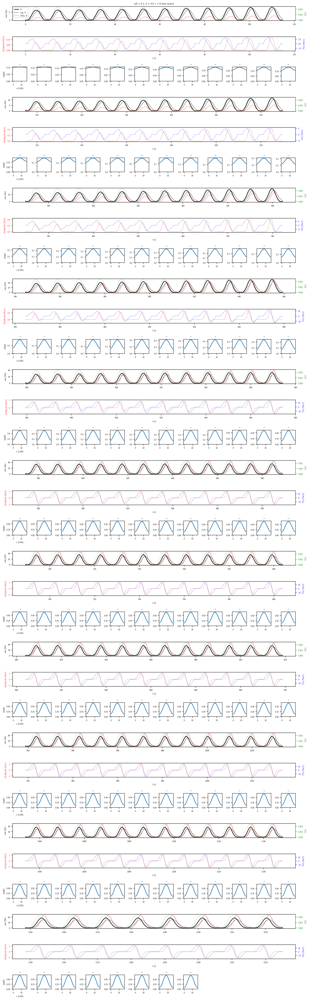

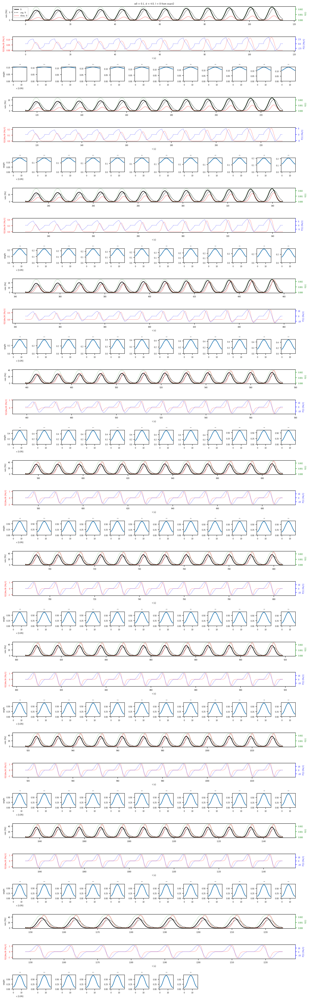

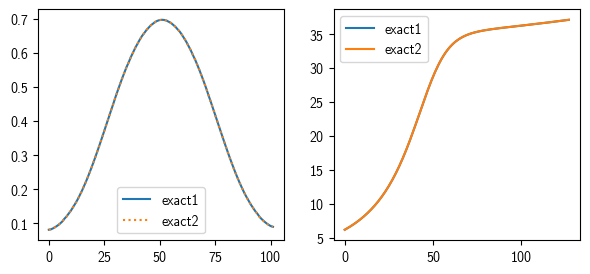

In [3]:
theme = 'homeo0'
#w0_range = [0.02,0.04,0.06,0.08]
w0_range = [0.1]
fork_ivp = True 
dT = 2
nt = 3000
nT = 128 
wt = [[],[]]
fr = [[],[]]
nx = 102
i = 0
for w0 in w0_range:
    wt1, fr1, rbar1 = iter_sweep('exact1', nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    wt2, fr2, rbar2 = iter_sweep('exact2', nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    wt[0].append(wt1[:,-1])
    wt[1].append(wt2[:,-1])
    i += 1
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = 'exact1')
    ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(nT), [np.max(fr1[i*nt+1:(i+1)*nt+1]) for i in range(nT)], label = 'exact1')
    ax[1].plot(np.arange(nT), [np.max(fr2[i*nt+1:(i+1)*nt+1]) for i in range(nT)], label = 'exact2')
    #ax[1].plot(np.arange(nT*dT)/dT, [np.max(fr2[i*_nt+1:(i+1)*_nt+1]) for i in range(nT*dT)], label = 'approx2')
    fr[0].append([np.max(fr1[i*nt+1:(i+1)*nt+1]) for i in range(nT)])
    fr[1].append([np.max(fr2[i*nt+1:(i+1)*nt+1]) for i in range(nT)])
    #fr[1].append([np.max(fr2[i*_nt+1:(i+1)*_nt+1]) for i in range(nT*dT)])
    ax[1].legend()
fig.savefig('exact1_vs_exact2_norm0.svg')
fig.savefig('exact1_vs_exact2_norm0.png')

In [ ]:
theme = 'homeo1'
#w0_range = [0.02,0.04,0.06,0.08]
w0_range = [0.1]
fork_ivp = True 
dT = 2
nt = 3000
nT = 128
wt = [[],[]]
fr = [[],[]]
nx = 102
i = 0
for w0 in w0_range:
    wt1, fr1, rbar1 = iter_sweep('exact1', nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 1)
    wt2, fr2, rbar2 = iter_sweep('exact2', nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 1)
    wt[0].append(wt1[:,-1])
    wt[1].append(wt2[:,-1])
    i += 1
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = 'exact1')
    ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(nT), [np.max(fr1[i*nt+1:(i+1)*nt+1]) for i in range(nT)], label = 'exact1')
    ax[1].plot(np.arange(nT), [np.max(fr2[i*nt+1:(i+1)*nt+1]) for i in range(nT)], label = 'exact2')
    #ax[1].plot(np.arange(nT*dT)/dT, [np.max(fr2[i*_nt+1:(i+1)*_nt+1]) for i in range(nT*dT)], label = 'approx2')
    fr[0].append([np.max(fr1[i*nt+1:(i+1)*nt+1]) for i in range(nT)])
    fr[1].append([np.max(fr2[i*nt+1:(i+1)*nt+1]) for i in range(nT)])
    #fr[1].append([np.max(fr2[i*_nt+1:(i+1)*_nt+1]) for i in range(nT*dT)])
    ax[1].legend()
fig.savefig('exact1_vs_exact2_norm1.svg')
fig.savefig('exact1_vs_exact2_norm1.png')

T = 9.571, dt = 3.190e-03, each LGN activated for 26.1%
no cap on weight
using method exact1
r0 * G <= 0.024545521722232896 < 1, the larger fixed point of the linearized system is always stable
128/128... T = 9.571, dt = 3.190e-03, each LGN activated for 26.1%
no cap on weight
using method exact2
r0 * G <= 0.024545521722232896 < 1, the larger fixed point of the linearized system is always stable
128/128... 

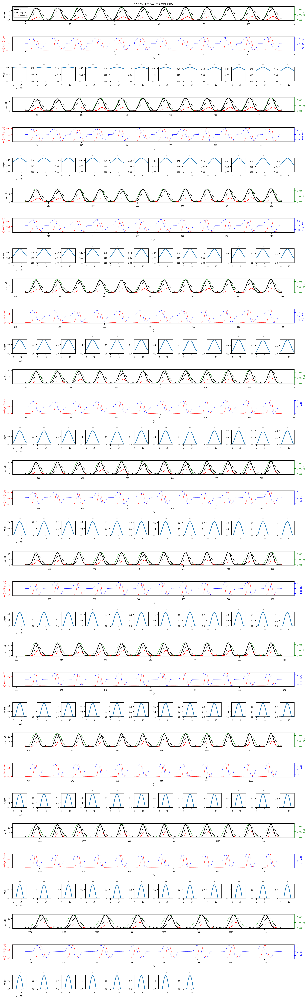

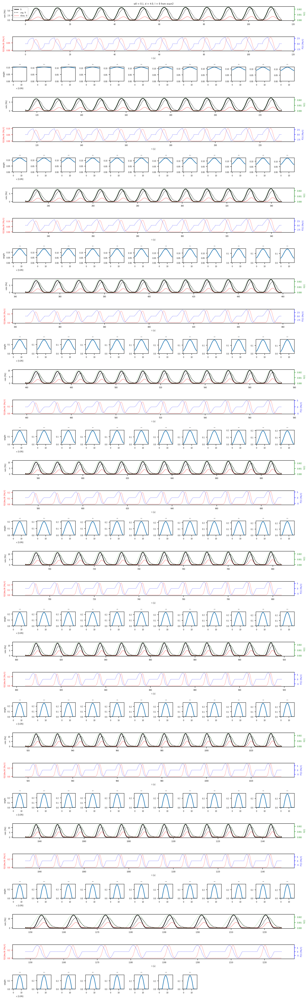

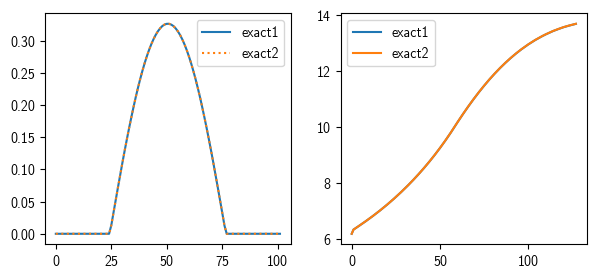

In [4]:
theme = 'homeo2'
#w0_range = [0.02,0.04,0.06,0.08]
w0_range = [0.1]
fork_ivp = True 
dT = 2
nt = 3000
nT = 128 
wt = [[],[]]
fr = [[],[]]
nx = 102
i = 0
for w0 in w0_range:
    wt1, fr1, rbar1 = iter_sweep('exact1', nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 2)
    wt2, fr2, rbar2 = iter_sweep('exact2', nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 2)
    wt[0].append(wt1[:,-1])
    wt[1].append(wt2[:,-1])
    i += 1
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = 'exact1')
    ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(nT), [np.max(fr1[i*nt+1:(i+1)*nt+1]) for i in range(nT)], label = 'exact1')
    ax[1].plot(np.arange(nT), [np.max(fr2[i*nt+1:(i+1)*nt+1]) for i in range(nT)], label = 'exact2')
    #ax[1].plot(np.arange(nT*dT)/dT, [np.max(fr2[i*_nt+1:(i+1)*_nt+1]) for i in range(nT*dT)], label = 'approx2')
    fr[0].append([np.max(fr1[i*nt+1:(i+1)*nt+1]) for i in range(nT)])
    fr[1].append([np.max(fr2[i*nt+1:(i+1)*nt+1]) for i in range(nT)])
    #fr[1].append([np.max(fr2[i*_nt+1:(i+1)*_nt+1]) for i in range(nT*dT)])
    ax[1].legend()
fig.savefig('exact1_vs_exact2_norm2.svg')
fig.savefig('exact1_vs_exact2_norm2.png')

2.0 2773
T = 8.319, dt = 3.000e-03, each LGN activated for 15.0%
no cap on weight
using method exact2
r0 * G <= 0.019793318193898894 < 1, the larger fixed point of the linearized system is always stable
400/400... 4.0 3190
T = 9.570, dt = 3.000e-03, each LGN activated for 26.1%
no cap on weight
using method exact2
r0 * G <= 0.019636417377786316 < 1, the larger fixed point of the linearized system is always stable
400/400... 6.0 3607
T = 10.821, dt = 3.000e-03, each LGN activated for 34.7%
no cap on weight
using method exact2
r0 * G <= 0.020338142437360672 < 1, the larger fixed point of the linearized system is always stable
400/400... 

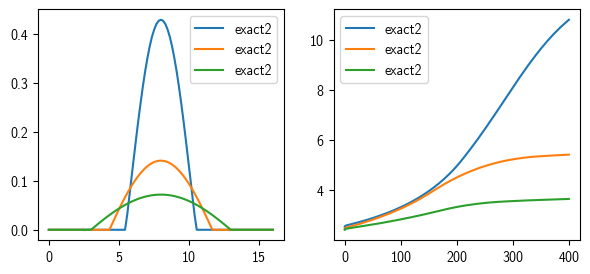

In [13]:
theme = 'width'
l = 8
deg_r = 10
#d_range = np.array([2.5,3.75,5,6.25,7.5])
d_range = np.array([2.5,5,7.5])
#w_range = np.array([0.08, 0.0603478, 0.04853145, 0.04052493, 0.0348231])
#w_range = np.array([1.0, 0.6, 0.5, 0.4, 0.35])*0.08
w_range = np.array([1.0, 0.5, 0.35])*0.08
#nT_range = np.array([100, 100, 100, 100, 100])*2
nT_range = np.array([100, 100, 100])*4
fork_ivp = True 
dT = 1
dt = 3e-3
k = 0.114*0.017
A = 0.02
gL = 40
wt = [[],[]]
fr = [[],[]]
nx = 101
i = 0
fig, ax = plt.subplots(1, 2, figsize = (7,3))
x = np.linspace(0,2*l,nx)
for _d in d_range:
    __d = _d/deg_r*l
    _nT = nT_range[i]
    _w0 = w_range[i]
    L = l*2*np.sqrt(2) + 2*__d
    T = L/v
    nt = int(T/dt)
    print(__d, nt)
    wt1, fr1, rbar1 = iter_sweep('exact2', nT = _nT, w0 = _w0, l = l, d = __d, v = v, k = k, A = A*_w0, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, plot = False, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 2, dt = dt, reset_fr = False)
    #wt2, fr2, rbar2 = iter_sweep('approx2', nT = dT*_nT, w0 = _w0, l = l, d = __d, v = v, k = k, A = A*_w0/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, plot = False, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 2, dt = dt, reset_fr = True)
    i += 1
    wt[0].append(wt1[:,-1])
    #wt[1].append(wt2[:,-1])
    nx = wt1.shape[0]
    ax[0].plot(x, wt1[:,-1], label = 'exact2')
    #ax[0].plot(x, wt2[:,-1], ':', label = 'approx2')
    ax[0].legend()
    ax[1].plot(np.arange(_nT), [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = 'exact2')
    #ax[1].plot(np.arange(_nT*dT)/dT, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = 'approx2, norm. t')
    fr[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
    #fr[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
    
ax[1].legend()
fig.savefig(f'{theme}-exact2_vs_approx2_homeo2_temp.png')

with open(f'{theme}-exact2_vs_approx2_homeo2.pkl', 'wb') as f:
    pickle.dump([w_range, nT_range, d_range, deg_r, l, nx, dT, wt, fr], f)

In [ ]:
plt.rcParams['font.family'] = 'CMU Sans Serif'
plt.rcParams['mathtext.fontset'] = 'cm'
theme = 'width'
with open(f'{theme}-exact2_vs_approx2_homeo2.pkl', 'rb') as f:
    w_range, nT_range, d_range, deg_r, l, nx, dT, wt, fr = pickle.load(f)
grid = gs.GridSpec(ncols = 3, nrows = 2, width_ratios = [1,1,1])
fig = plt.figure(figsize = (9,2), dpi = 200)
ax0 = fig.add_subplot(grid[:,0])
ax1 = fig.add_subplot(grid[:,1])
ax2 = fig.add_subplot(grid[1,2])
#n = 3

FS = 12
fs = 8
n = len(d_range)
dw = 0.4
lw0 = 2
ms0 = 2
dms = 2
c, mc, _, ac = get_colors(n)
exact = []
approx = []
iv = []
for i in range(n):
    lbl = r''
    x = np.linspace(0,2*l,nx)
    exact.append(ax0.plot(x, wt[0][i], '-', lw = lw0 + (i+1)/n * dw, color = c[i], alpha = 0.9))
    approx.append(ax0.plot(x, wt[1][i], ':', lw = lw0 + (i+1)/n * dw, color = ac[i], alpha = 0.9))
    ax1.plot(np.arange(nT_range[i])+1, fr[0][i], '-', lw = lw0 + (i+1)/n * dw, color = c[i], alpha = 0.9)
    ax1.plot(np.arange(nT_range[i]*dT)/dT+1, fr[1][i], ':', lw = lw0 + (i+1)/n * dw, color = ac[i], alpha = 0.9)
        
for i in range(n):
    xl = np.nonzero(wt[0][i] - w_range[i] > 0)[0][0]
    xr = nx - 1 - np.nonzero(np.flip(wt[0][i]) - w_range[i] > 0)[0][0]
    if xl > 0:
        xl = x[xl-1] + (w_range[i] - wt[0][i][xl-1])/(wt[0][i][xl] - wt[0][i][xl-1])*(x[1]-x[0])
    else:
        xl = x[xl]
    if xr < nx-1:
        xr = x[xr+1] - (w_range[i] - wt[0][i][xr+1])/(wt[0][i][xr] - wt[0][i][xr+1])*(x[1]-x[0])
    else:
        xr = x[xr]
    iv.append(ax0.plot([xl, xr], [w_range[i],w_range[i]], 'o', fillstyle = 'none', color = mc[i], ms = ms0 + (i+1)/n * dms, alpha = 0.7))
    ax2.bar(i+0.5, (xr-xl)/2, color = c[i])
    
#ax2.set_ylim([0, l])
ax2.set_xticks(np.arange(n)+0.5, [f'{_d/20*l:.0f}' for _d in d_range])
ax2.set_xlabel(r'd (#LGN)', fontsize = FS)
ax2.set_ylabel('CL. (#LGN)', fontsize = FS)
ax2.spines[['right', 'top']].set_visible(False)
leg1 = ax0.legend([(eh[0], ah[0], ih[0]) for eh, ah, ih in zip(exact, approx, iv)], [rf'$d = {d_range[i]/20*l:.0f}$' for i in range(n)], loc = 'upper left', fontsize = fs, frameon = False)
ax0.add_artist(leg1)
ax0.legend([exact[-1][0], approx[0][0], iv[-1][0]], ['exact', 'approx.', r'$w_0$'], fontsize=fs, handlelength = 1.5, labelspacing = 0.3)
ax0.set_xlabel(r'$x$ (#LGN)', fontsize = FS)
ax0.set_ylabel('conn. weight', fontsize = FS)
ax1.set_xlabel('time (#sweep)', fontsize = FS)
ax1.set_ylabel('max FR. (Hz)', fontsize = FS)
fig.tight_layout()
fig.savefig(f'{theme}-homeo2.png')
fig.savefig(f'{theme}-homeo2.svg')

TypeError: iter_sweep() got an unexpected keyword argument 'G_perc'

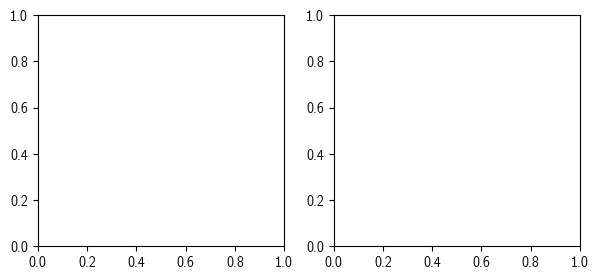

In [8]:
theme = 'speed-post'
method = 'exact2'
approx_only = False 
d = 4
#w0 = 0.049359446
w0 = 0.15
v_range = np.array([1.6,3.2,6.4,9.6,12.8])
nT_range = np.array([50,100,200,300,400])
#v_range = [v_range[0], v_range[-1]]
#nT_range = [nT_range[0], nT_range[-1]]
fork_ivp = True 
k = 0.114*0.017
A = 0.01*w0
r0 = 6
rLTD = 0.3
dT = 1
dt = 5e-3
wt_v = [[],[]]
fr_v = [[],[]]
nx = 101
i = 0
norm_w = 2
L = l*2*np.sqrt(2) + 2*d
x = np.linspace(0,2*l,nx)
fig, ax = plt.subplots(1, 2, figsize = (7,3))
for _v in v_range:
    _nT = nT_range[i]
    T = L/_v
    nt = int(T/dt)
    if not approx_only:
        wt1, fr1, rbar1 = iter_sweep(method, nT = _nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = False, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 1.0, dt = dt, reset_fr = False)
    wt2, fr2, rbar2 = iter_sweep('approx2', nT = dT*_nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = False, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 1.0, dt = dt, reset_fr = True)
    i += 1
    nx = wt1.shape[0]
    if not approx_only:
        wt_v[0].append(wt1[:,-1])
        ax[0].plot(x, wt1[:,-1], label = f'{method}-{i}')
        ax[1].plot((np.arange(_nT)+1)*T/60, [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = f'{method}-{i}')
        fr_v[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
        
    wt_v[1].append(wt2[:,-1])
    ax[0].plot(x, wt2[:,-1], ':', label = f'approx2-{i}')
    ax[1].plot((np.arange(_nT*dT)/dT + 1)*T/60, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = f'approx2-{i}')
    fr_v[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
ax[1].legend()
ax[1].set_xlabel('t (min)')
#fig.savefig(f'{theme}-homeo{norm_w}_temp.svg')
fig.savefig(f'{theme}-homeo{norm_w}_temp.png')
with open(f'{theme}-exact2_vs_approx2_homeo2.pkl', 'wb') as f:
    pickle.dump([w0, nT_range, v_range, L, l, nx, dT, wt_v, fr_v], f)

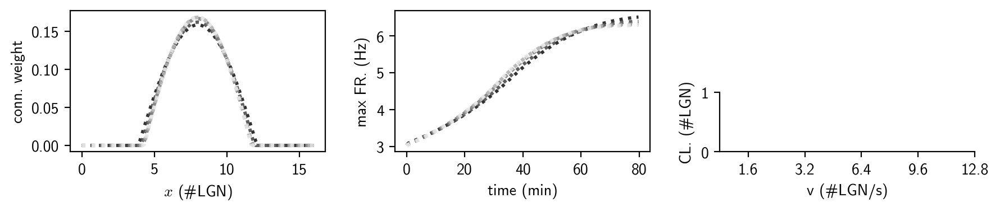

In [56]:
plt.rcParams['font.family'] = 'CMU Sans Serif'
plt.rcParams['mathtext.fontset'] = 'cm'
theme = 'speed'
with open(f'{theme}-exact2_vs_approx2_homeo2.pkl', 'rb') as f:
    w0, nT_range, v_range, L, l, nx, dT, wt_v, fr_v = pickle.load(f)
grid = gs.GridSpec(ncols = 3, nrows = 2, width_ratios = [1,1,1])
fig = plt.figure(figsize = (9,2), dpi = 200)
ax0 = fig.add_subplot(grid[:,0])
ax1 = fig.add_subplot(grid[:,1])
ax2 = fig.add_subplot(grid[:,2])
#n = 3
fs = 10
n = len(v_range)
dw = 0.4
lw0 = 2
ms0 = 2
dms = 2
c, mc, _, ac = get_colors(n)
exact = []
approx = []
iv = []
for i in range(n):
    lbl = r''
    T = L/v_range[i]
    x = np.linspace(0,2*l,nx)
    #exact.append(ax0.plot(x, wt_v[0][i], '-', lw = lw0 + (i+1)/n * dw, color = c[i], alpha = 0.9))
    approx.append(ax0.plot(x, wt_v[1][i], ':', lw = lw0 + (i+1)/n * dw, color = ac[i], alpha = 0.9))
    #ax1.plot((np.arange(nT_range[i])+1)*T/60, fr_v[0][i], '-', lw = lw0 + (i+1)/n * dw, color = c[i], alpha = 0.9)
    ax1.plot((np.arange(nT_range[i]*dT)/dT+1)*T/60, fr_v[1][i], ':', lw = lw0 + (i+1)/n * dw, color = ac[i], alpha = 0.9)
        
#for i in range(n):
#    xl = np.nonzero(wt_v[0][i] - w0 > 0)[0][0]
#    xr = nx - 1 - np.nonzero(np.flip(wt_v[0][i]) - w0 > 0)[0][0]
#    if xl > 0:
#        xl = x[xl-1] + (w0 - wt_v[0][i][xl-1])/(wt_v[0][i][xl] - wt_v[0][i][xl-1])*(x[1]-x[0])
#    else:
#        xl = x[xl]
#    if xr < nx-1:
#        xr = x[xr+1] - (w0 - wt_v[0][i][xr+1])/(wt_v[0][i][xr] - wt_v[0][i][xr+1])*(x[1]-x[0])
#    else:
#        xr = x[xr]
#    iv.append(ax0.plot([xl, xr], [w0, w0], 'o', fillstyle = 'none', color = mc[i], ms = ms0 + (i+1)/n * dms, alpha = 0.7))
#    ax2.bar(i+0.5, (xr-xl)/2, color = c[i])
    
#ax2.set_ylim([0, l])
ax2.set_xticks(np.arange(n)+0.5, [f'{_v}' for _v in v_range])
ax2.set_xlabel(r'v (#LGN/s)', fontsize = fs)
ax2.set_ylabel('CL. (#LGN)', fontsize = fs)
ax2.spines[['right', 'top']].set_visible(False)
#leg1 = ax0.legend([(eh[0], ah[0], ih[0]) for eh, ah, ih in zip(exact, approx, iv)], [rf'$v = {v_range[i]}$' for i in range(n)], loc = 'upper left', fontsize = fs-2, frameon = False)
#ax0.add_artist(leg1)
#ax0.legend([exact[-1][0], approx[0][0], iv[-1][0]], ['exact', 'approx.', r'$w_0$'], fontsize=fs-1, handlelength = 1.5, labelspacing = 0.3)
ax0.set_xlabel(r'$x$ (#LGN)')
ax0.set_ylabel('conn. weight', fontsize = fs)
ax1.set_xlabel('time (min)', fontsize = fs)
ax1.set_ylabel('max FR. (Hz)', fontsize = fs)
fig.tight_layout()
fig.savefig(f'{theme}-homeo2.png')
fig.savefig(f'{theme}-homeo2.svg')

In [ ]:
theme = 'speed_mod2'
method = 'exact2'
d = 4
w0 = 0.036
v_range = np.array([1.6,3.2,4.8,6.4,8])
nT_range = np.array([30,60,90,120,150])*3
#v_range = np.array([1.6,3.2])
#nT_range = np.array([44,88])
#nT_range = np.array([15,30])
fork_ivp = True 
k = 0.114*0.017
A = 0.002
dT = 1
r0 = 6
rLTD = 0.3
nt = 5000
wt = [[],[]]
fr = [[],[]]
nx = 102
tau = 0.5
i = 0
norm_w = 0
for _v in v_range:
    _nT = nT_range[i]
    wt1, fr1, rbar1 = iter_sweep(method, nT = _nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 1.0)
    #wt2, fr2, rbar2 = iter_sweep('exact2', nT = dT*_nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    i += 1
    wt[0].append(wt1[:,-1])
    #wt[1].append(wt2[:,-1])
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = method)
    #ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(_nT), [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = method)
    #ax[1].plot(np.arange(_nT*dT)/dT, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = 'exact2')
    fr[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
    #fr[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
    ax[1].legend()
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.svg')
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.png')

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (7,3), dpi = 200)
n = len(v_range)
lw = 2
for i in range(n):
    lbl = f'v={v_range[i]}'
    x = np.linspace(0,2*l,nx)
    ax[0].plot(x, wt[0][i], 'b', lw = (i+1)/n * lw, label = lbl)
    xl = np.nonzero(wt[0][i] - w0 > 0)[0][0]
    xr = nx - 1 - np.nonzero(np.flip(wt[0][i]) - w0 > 0)[0][0]
    if xl > 0:
        xl = x[xl-1] + (w0 - wt[0][i][xl-1])/(wt[0][i][xl] - wt[0][i][xl-1])*(x[1]-x[0])
    else:
        xl = x[xl]
    if xr < nx-1:
        xr = x[xr+1] - (w0 - wt[0][i][xr+1])/(wt[0][i][xr] - wt[0][i][xr+1])*(x[1]-x[0])
    else:
        xr = x[xr]
    ax[0].plot([xl, xr], [w0, w0], '*r', ms = 2)
    ax[1].plot(np.arange(nT_range[i])+1, fr[0][i], lw = (i+1)/n * lw, label = lbl)
    #ax[1].plot(np.arange(nT_range[i]*dT)/dT+1, fr[1][i], lw = (i+1)/n * lw, label = lbl)
ax[0].legend(fontsize='x-small')
ax[0].set_xlabel('visual position (\#LGN)')
ax[0].set_ylabel('weight')
ax[1].set_xlabel('time (\#sweep)')
ax[1].set_ylabel('rate (Hz)')
fig.tight_layout()
fig.savefig(f'{theme}-{method}-homeo{norm_w}.png')
fig.savefig(f'{theme}-{method}-homeo{norm_w}.svg')

In [ ]:
theme = 'speed_mod3'
method = 'exact2'
d = 4
w0 = 0.06581
v_range = np.array([1.6,3.2,4.8,6.4,8])
nT_range = np.array([30,60,90,120,150])
#v_range = np.array([1.6,3.2])
#nT_range = np.array([44,88])
#nT_range = np.array([15,30])
fork_ivp = True 
k = 0.114*0.017
A = 0.002
dT = 1
r0 = 6
rLTD = 0.3
nt = 5000
wt = [[],[]]
fr = [[],[]]
nx = 102
tau = 1.0
i = 0
norm_w = 0
for _v in v_range:
    _nT = nT_range[i]
    wt1, fr1, rbar1 = iter_sweep(method, nT = _nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 0.8)
    #wt2, fr2, rbar2 = iter_sweep('exact2', nT = dT*_nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    i += 1
    wt[0].append(wt1[:,-1])
    #wt[1].append(wt2[:,-1])
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = method)
    #ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(_nT), [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = method)
    #ax[1].plot(np.arange(_nT*dT)/dT, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = 'exact2')
    fr[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
    #fr[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
    ax[1].legend()
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.svg')
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.png')

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (7,3), dpi = 200)
n = len(v_range)
lw = 2
for i in range(n):
    lbl = f'v={v_range[i]}'
    x = np.linspace(0,2*l,nx)
    ax[0].plot(x, wt[0][i], 'b', lw = (i+1)/n * lw, label = lbl)
    xl = np.nonzero(wt[0][i] - w0 > 0)[0][0]
    xr = nx - 1 - np.nonzero(np.flip(wt[0][i]) - w0 > 0)[0][0]
    if xl > 0:
        xl = x[xl-1] + (w0 - wt[0][i][xl-1])/(wt[0][i][xl] - wt[0][i][xl-1])*(x[1]-x[0])
    else:
        xl = x[xl]
    if xr < nx-1:
        xr = x[xr+1] - (w0 - wt[0][i][xr+1])/(wt[0][i][xr] - wt[0][i][xr+1])*(x[1]-x[0])
    else:
        xr = x[xr]
    ax[0].plot([xl, xr], [w0, w0], '*r', ms = 2)
    ax[1].plot(np.arange(nT_range[i])+1, fr[0][i], lw = (i+1)/n * lw, label = lbl)
    #ax[1].plot(np.arange(nT_range[i]*dT)/dT+1, fr[1][i], lw = (i+1)/n * lw, label = lbl)
ax[0].legend(fontsize='x-small')
ax[0].set_xlabel('visual position (\#LGN)')
ax[0].set_ylabel('weight')
ax[1].set_xlabel('time (\#sweep)')
ax[1].set_ylabel('rate (Hz)')
fig.tight_layout()
fig.savefig(f'{theme}-{method}-homeo{norm_w}.png')
fig.savefig(f'{theme}-{method}-homeo{norm_w}.svg')

In [ ]:
theme = 'speed_mod4'
method = 'exact2'
d = 4
w0 = 0.06581
v_range = np.array([1.6,3.2,4.8,6.4,8])
nT_range = np.array([30,60,90,120,150])
#v_range = np.array([1.6,3.2])
#nT_range = np.array([44,88])
#nT_range = np.array([15,30])
fork_ivp = True 
k = 0.114*0.017
A = 0.002
dT = 1
r0 = 6
rLTD = 0.3
nt = 5000
wt = [[],[]]
fr = [[],[]]
nx = 102
tau = 3.0
i = 0
norm_w = 0
for _v in v_range:
    _nT = nT_range[i]
    wt1, fr1, rbar1 = iter_sweep(method, nT = _nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 1.0)
    #wt2, fr2, rbar2 = iter_sweep('exact2', nT = dT*_nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    i += 1
    wt[0].append(wt1[:,-1])
    #wt[1].append(wt2[:,-1])
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = method)
    #ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(_nT), [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = method)
    #ax[1].plot(np.arange(_nT*dT)/dT, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = 'exact2')
    fr[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
    #fr[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
    ax[1].legend()
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.svg')
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.png')

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (7,3), dpi = 200)
n = len(v_range)
lw = 2
for i in range(n):
    lbl = f'v={v_range[i]}'
    x = np.linspace(0,2*l,nx)
    ax[0].plot(x, wt[0][i], 'b', lw = (i+1)/n * lw, label = lbl)
    xl = np.nonzero(wt[0][i] - w0 > 0)[0][0]
    xr = nx - 1 - np.nonzero(np.flip(wt[0][i]) - w0 > 0)[0][0]
    if xl > 0:
        xl = x[xl-1] + (w0 - wt[0][i][xl-1])/(wt[0][i][xl] - wt[0][i][xl-1])*(x[1]-x[0])
    else:
        xl = x[xl]
    if xr < nx-1:
        xr = x[xr+1] - (w0 - wt[0][i][xr+1])/(wt[0][i][xr] - wt[0][i][xr+1])*(x[1]-x[0])
    else:
        xr = x[xr]
    ax[0].plot([xl, xr], [w0, w0], '*r', ms = 2)
    ax[1].plot(np.arange(nT_range[i])+1, fr[0][i], lw = (i+1)/n * lw, label = lbl)
    #ax[1].plot(np.arange(nT_range[i]*dT)/dT+1, fr[1][i], lw = (i+1)/n * lw, label = lbl)
ax[0].legend(fontsize='x-small')
ax[0].set_xlabel('visual position (\#LGN)')
ax[0].set_ylabel('weight')
ax[1].set_xlabel('time (\#sweep)')
ax[1].set_ylabel('rate (Hz)')
fig.tight_layout()
fig.savefig(f'{theme}-{method}-homeo{norm_w}.png')
fig.savefig(f'{theme}-{method}-homeo{norm_w}.svg')

In [ ]:
theme = 'speed_mod5'
method = 'exact2'
d = 15
w0 = 0.06581
v_range = np.array([1.6,3.2,4.8,6.4,8])
nT_range = np.array([30,60,90,120,150])
#v_range = np.array([1.6,3.2])
#nT_range = np.array([44,88])
#nT_range = np.array([15,30])
fork_ivp = True 
k = 0.114*0.017
A = 0.002
dT = 1
r0 = 6
rLTD = 0.3
nt = 5000
wt = [[],[]]
fr = [[],[]]
nx = 102
tau = 1.0
i = 0
norm_w = 0
for _v in v_range:
    _nT = nT_range[i]
    wt1, fr1, rbar1 = iter_sweep(method, nT = _nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 1.0)
    #wt2, fr2, rbar2 = iter_sweep('exact2', nT = dT*_nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    i += 1
    wt[0].append(wt1[:,-1])
    #wt[1].append(wt2[:,-1])
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = method)
    #ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(_nT), [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = method)
    #ax[1].plot(np.arange(_nT*dT)/dT, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = 'exact2')
    fr[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
    #fr[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
    ax[1].legend()
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.svg')
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.png')

In [ ]:
plt.rcParams['text.usetex'] = True
#plt.rcParams['font.family'] = 'DejaVu Sans'
fig, ax = plt.subplots(1,2, figsize = (7,3), dpi = 200)
n = len(v_range)
lw = 2
for i in range(n):
    lbl = f'v={v_range[i]}'
    x = np.linspace(0,2*l,nx)
    ax[0].plot(x, wt[0][i], 'b', lw = (i+1)/n * lw, label = lbl)
    xl = np.nonzero(wt[0][i] - w0 > 0)[0][0]
    xr = nx - 1 - np.nonzero(np.flip(wt[0][i]) - w0 > 0)[0][0]
    if xl > 0:
        xl = x[xl-1] + (w0 - wt[0][i][xl-1])/(wt[0][i][xl] - wt[0][i][xl-1])*(x[1]-x[0])
    else:
        xl = x[xl]
    if xr < nx-1:
        xr = x[xr+1] - (w0 - wt[0][i][xr+1])/(wt[0][i][xr] - wt[0][i][xr+1])*(x[1]-x[0])
    else:
        xr = x[xr]
    ax[0].plot([xl, xr], [w0, w0], '*r', ms = 2)
    ax[1].plot(np.arange(nT_range[i])+1, fr[0][i], lw = (i+1)/n * lw, label = lbl)
    #ax[1].plot(np.arange(nT_range[i]*dT)/dT+1, fr[1][i], lw = (i+1)/n * lw, label = lbl)
ax[0].legend(fontsize='x-small')
ax[0].set_xlabel('visual position (\#LGN)')
ax[0].set_ylabel('weight')
ax[1].set_xlabel('time (\#sweep)')
ax[1].set_ylabel('rate (Hz)')
fig.tight_layout()
fig.savefig(f'{theme}-{method}-homeo{norm_w}.png')
fig.savefig(f'{theme}-{method}-homeo{norm_w}.svg')

In [ ]:
theme = 'tau_mod'
method = 'exact2'
d = 4
w0 = 0.05461
tau_range = np.array([0.25,0.5,1.0,2.0,4.0])
nT = 80
fork_ivp = True 
k = 0.114*0.017
A = 0.002
r0 = 6
rLTD = 0.3
dT = 1
nt = 5000
wt = [[],[]]
fr = [[],[]]
nx = 102
i = 0
norm_w = 0
for _tau in tau_range:
    wt1, fr1, rbar1 = iter_sweep(method, nT = nT, w0 = w0, l = l, d = d, v = v, k = k, A = A, rLTD = rLTD, r0 = r0, rx = rx, tau = _tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = norm_w, G_perc = 1.0)
    #wt2, fr2, rbar2 = iter_sweep('exact2', nT = dT*_nT, w0 = w0, l = l, d = d, v = _v, k = k, A = A/dT, rLTD = rLTD, r0 = r0, rx = rx, tau = tau, tau_m = tau_m, gL = gL, cap = cap, nx = nx, nt = nt, plot = True, theme = f'{theme}_{i}', fork_ivp = fork_ivp, shape = shape, reverse = 1, norm_w = 0)
    i += 1
    wt[0].append(wt1[:,-1])
    #wt[1].append(wt2[:,-1])
    fig, ax = plt.subplots(1, 2, figsize = (7,3))
    nx = wt1.shape[0]
    ax[0].plot(np.arange(nx), wt1[:,-1], label = method)
    #ax[0].plot(np.arange(nx), wt2[:,-1], ':', label = 'exact2')
    ax[0].legend()
    ax[1].plot(np.arange(_nT), [np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)], label = method)
    #ax[1].plot(np.arange(_nT*dT)/dT, [np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)], label = 'exact2')
    fr[0].append([np.max(fr1[j*nt+1:(j+1)*nt+1]) for j in range(_nT)])
    #fr[1].append([np.max(fr2[j*nt+1:(j+1)*nt+1]) for j in range(_nT*dT)])
    ax[1].legend()
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.svg')
fig.savefig(f'{theme}-{method}_homeo{norm_w}t.png')

In [ ]:
fig, ax = plt.subplots(1,2, figsize = (7,3), dpi = 200)
n = len(tau_range)
lw = 2
for i in range(n):
    lbl = f'tau={tau_range[i]}'
    x = np.linspace(0,2*l,nx)
    ax[0].plot(x, wt[0][i], 'b', lw = (i+1)/n * lw, label = lbl)
    xl = np.nonzero(wt[0][i] - w0 > 0)[0][0]
    xr = nx - 1 - np.nonzero(np.flip(wt[0][i]) - w0 > 0)[0][0]
    if xl > 0:
        xl = x[xl-1] + (w0 - wt[0][i][xl-1])/(wt[0][i][xl] - wt[0][i][xl-1])*(x[1]-x[0])
    else:
        xl = x[xl]
    if xr < nx-1:
        xr = x[xr+1] - (w0 - wt[0][i][xr+1])/(wt[0][i][xr] - wt[0][i][xr+1])*(x[1]-x[0])
    else:
        xr = x[xr]
    ax[0].plot([xl, xr], [w0, w0], '*r', ms = 2)
    ax[1].plot(np.arange(nT_range[i])+1, fr[0][i], lw = (i+1)/n * lw, label = lbl)
    #ax[1].plot(np.arange(nT_range[i]*dT)/dT+1, fr[1][i], lw = (i+1)/n * lw, label = lbl)
ax[0].legend(fontsize='x-small')
ax[0].set_xlabel('visual position (\#LGN)')
ax[0].set_ylabel('weight')
ax[1].set_xlabel('time (\#sweep)')
ax[1].set_ylabel('rate (Hz)')
fig.tight_layout()
fig.savefig(f'{theme}-{method}-homeo{norm_w}.png')
fig.savefig(f'{theme}-{method}-homeo{norm_w}.svg')